In [1]:
# Data science libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

# NLP libraries
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
from nltk.stem import WordNetLemmatizer


In [2]:
# Load csv
df = pd.read_csv('data/goemotions.csv')

# Show first 5 rows
df.head()

,text,emotion
0,We can hope,optimism
1,Shhh don't give them the idea!,anger
2,"Thank you so much, kind stranger. I really nee...",gratitude
3,Ion know but it would be better for you to jus...,neutral
4,I'm honestly surprised. We should have fallen ...,excitement


Este dataset contiene dos columnas, una con el texto y otra con la emoción

# Comprobar si hay duplicados

In [3]:
# Number of duplicate rows
df.duplicated().sum()

53525

In [4]:
# Remove duplicates
df.drop_duplicates(inplace=True)
df.shape

(118295, 2)

# Comprobar los tipos de los datos y si hay valores nulos

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 118295 entries, 0 to 171819
Data columns (total 2 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   text     118295 non-null  object
 1   emotion  118295 non-null  object
dtypes: object(2)
memory usage: 2.7+ MB


In [6]:
df.describe()

# The frec value indicates the number of times the most frequent value appears

,text,emotion
count,118295,118295
unique,56452,28
top,"Hi, [NAME]! I am stopping by to wish you the b...",neutral
freq,6,31446


Ambas columnas son de tipo objeto

In [7]:
df.isnull().sum()

text       0
emotion    0
dtype: int64

No hay duplicados

# Análisis de class imbalance

In [8]:
# check class imbalance in percentage
df['emotion'].value_counts(normalize=True) * 100

# the emotions classes are clearly imbalanced. We can deal with this problem through resampling techniques ot class weighting. 

emotion
neutral           26.582696
approval           7.537935
admiration         5.773701
annoyance          5.762712
disapproval        5.045860
curiosity          3.457458
realization        3.432943
anger              3.368697
disappointment     3.354326
gratitude          3.304451
amusement          3.277400
confusion          3.265565
optimism           2.978148
joy                2.858109
love               2.499683
sadness            2.473477
caring             2.317089
surprise           2.201276
excitement         2.082083
disgust            1.997549
desire             1.421869
fear               1.094721
embarrassment      1.011877
remorse            0.940868
nervousness        0.590896
relief             0.575679
pride              0.530031
grief              0.262902
Name: proportion, dtype: float64

Vamos a quitar aquellas emociones que aparecen menos del 1% de las veces, porque tenemos suficientes datos aún así.

In [9]:
# Remove emotions that have less than 1% of the data (df['emotion'].value_counts(normalize=True) * 100) < 1
df = df[df['emotion'].map(df['emotion'].value_counts(normalize=True) * 100 >= 1)]

In [10]:
df['emotion'].value_counts(normalize=True) * 100

emotion
neutral           27.376724
approval           7.763094
admiration         5.946162
annoyance          5.934845
disapproval        5.196580
curiosity          3.560733
realization        3.535485
anger              3.469320
disappointment     3.454520
gratitude          3.403155
amusement          3.375296
confusion          3.363108
optimism           3.067105
joy                2.943481
love               2.574349
sadness            2.547360
caring             2.386300
surprise           2.267029
excitement         2.144275
disgust            2.057215
desire             1.464340
fear               1.127420
embarrassment      1.042102
Name: proportion, dtype: float64

# Procesamiento de texto

In [11]:
# Download stopwords and wordnet
nltk.download("stopwords")
nltk.download("wordnet")

# Remove special characters
def remove_special_characters(sentences, remove_digits=False):
    clean_sentences = []
    for sent in sentences:
        pattern = r'/[^\w-]|_/' if not remove_digits else r'[^a-zA-Z\s]'  # r'/[^\w-]|_/': characters which are not word characters (alphanumeric or underscore) or hyphens
                                                                          # r'[^a-zA-Z\s]': characters which are not letters or whitespaces
        clean_text = re.sub(pattern, '', sent) # replace the pattern with an empty string
        clean_sentences.append(clean_text)
    # print(clean_sentences)
    return clean_sentences

# Load stopwords
stop_words = stopwords.words("english")
# Create lemmatizer
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\belus\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\belus\AppData\Roaming\nltk_data...


In [12]:
# Apply remove_special_characters
df["clean_text"] = remove_special_characters(df["text"], remove_digits=True)
df.head(n=14)


['We can hope', 'Shhh dont give them the idea', 'Thank you so much kind stranger I really need that', 'Ion know but it would be better for you to just buy some trim and make them yourself its not that hard and you can dose it', 'Im honestly surprised We should have fallen much farther', 'Jurisprudence fetishist gets off on technicality', 'One of my worst nightmares Ugh', 'Is this real ', 'My favorite pod when they are fresh  clear Sadly all of my recent packs look like dark brown syrup pods ', 'Forgot what its like to actually not dislike one of the patients', 'Still better than YouTube rewind', 'just end the friendship and go meet more people Youre just prolonging the obvious', 'I want a pizza flair', 'That was so disgusting VWP', 'Im more worried about the dude getting pissed all over my shoes', 'That really sucks How old is your baby', 'Please keep going this is just making you look worse', 'I dont get it Are they upset that men arent all using the blue nametags because blue is the 

,text,emotion,clean_text
0,We can hope,optimism,We can hope
1,Shhh don't give them the idea!,anger,Shhh dont give them the idea
2,"Thank you so much, kind stranger. I really nee...",gratitude,Thank you so much kind stranger I really need ...
3,Ion know but it would be better for you to jus...,neutral,Ion know but it would be better for you to jus...
4,I'm honestly surprised. We should have fallen ...,excitement,Im honestly surprised We should have fallen mu...
5,Jurisprudence fetishist gets off on technicality.,neutral,Jurisprudence fetishist gets off on technicality
6,One of my worst nightmares. Ugh.,fear,One of my worst nightmares Ugh
7,Is this real? 🤔,curiosity,Is this real
8,My favorite pod when they are fresh & clear. S...,neutral,My favorite pod when they are fresh clear Sad...
9,Forgot what it's like to actually not dislike ...,disappointment,Forgot what its like to actually not dislike o...


In [13]:
# Apply lemmatization
df["clean_text"] = df["clean_text"].apply(lambda x: " ".join([lemmatizer.lemmatize(word) for word in x.split()]))
df.head(n=14)


,text,emotion,clean_text
0,We can hope,optimism,We can hope
1,Shhh don't give them the idea!,anger,Shhh dont give them the idea
2,"Thank you so much, kind stranger. I really nee...",gratitude,Thank you so much kind stranger I really need ...
3,Ion know but it would be better for you to jus...,neutral,Ion know but it would be better for you to jus...
4,I'm honestly surprised. We should have fallen ...,excitement,Im honestly surprised We should have fallen mu...
5,Jurisprudence fetishist gets off on technicality.,neutral,Jurisprudence fetishist get off on technicality
6,One of my worst nightmares. Ugh.,fear,One of my worst nightmare Ugh
7,Is this real? 🤔,curiosity,Is this real
8,My favorite pod when they are fresh & clear. S...,neutral,My favorite pod when they are fresh clear Sadl...
9,Forgot what it's like to actually not dislike ...,disappointment,Forgot what it like to actually not dislike on...


In [14]:
# Remove stopwords
df["clean_text"] = df["clean_text"].apply(lambda x: " ".join([word for word in x.split() if word not in stop_words]))
df.head(n=14)

,text,emotion,clean_text
0,We can hope,optimism,We hope
1,Shhh don't give them the idea!,anger,Shhh dont give idea
2,"Thank you so much, kind stranger. I really nee...",gratitude,Thank much kind stranger I really need
3,Ion know but it would be better for you to jus...,neutral,Ion know would better buy trim make hard dose
4,I'm honestly surprised. We should have fallen ...,excitement,Im honestly surprised We fallen much farther
5,Jurisprudence fetishist gets off on technicality.,neutral,Jurisprudence fetishist get technicality
6,One of my worst nightmares. Ugh.,fear,One worst nightmare Ugh
7,Is this real? 🤔,curiosity,Is real
8,My favorite pod when they are fresh & clear. S...,neutral,My favorite pod fresh clear Sadly recent pack ...
9,Forgot what it's like to actually not dislike ...,disappointment,Forgot like actually dislike one patient


# Distribución de frecuencias

In [23]:
# Get the number of occurrences of every word in the dataset in a dataframe
word_freq = pd.Series(" ".join(df["clean_text"]).split()).value_counts()
word_freq_table = pd.DataFrame(word_freq).reset_index()
word_freq_table.columns = ["Word", "Frequency"]
word_freq_table.head()

,Word,Frequency
0,I,38956
1,NAME,20502
2,wa,9934
3,like,9061
4,Im,6794


En este dataset todos los nombres se han sustituido por [NAME], por lo que vamos a ver cómo se quedaría la distribución de palabras sin esta

In [24]:
# delete [NAME] from word_freq
word_freq = word_freq.drop("NAME", errors="ignore")

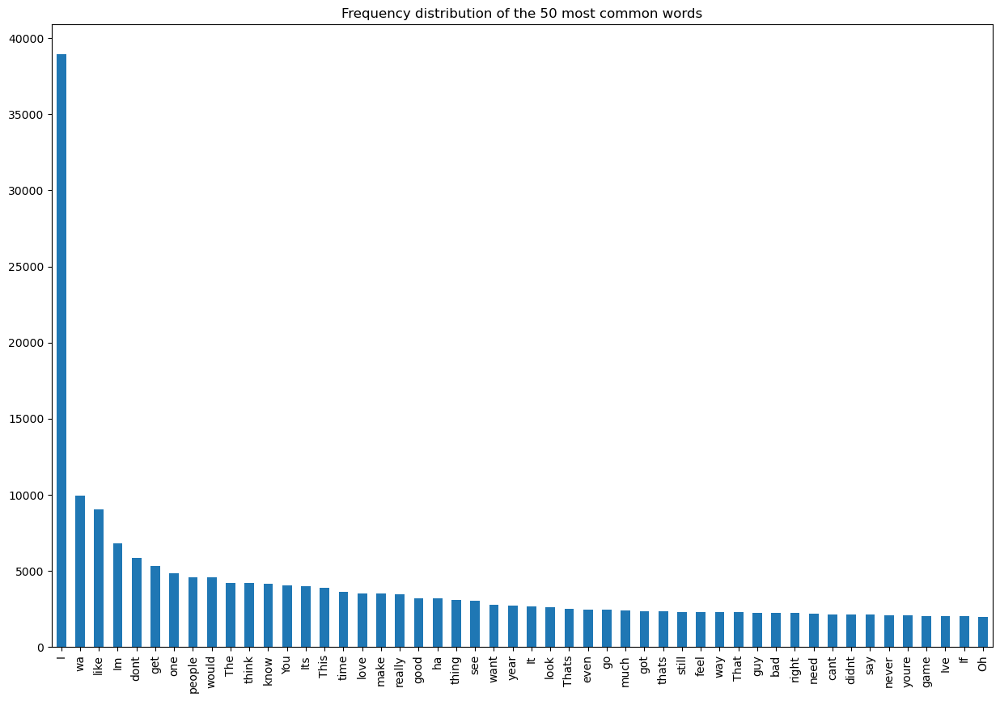

In [25]:
# Plot the frequency distribution of the 50 most common words in the dataset
plt.figure(figsize=(15, 10))
word_freq[:50].plot(kind="bar")
plt.title("Frequency distribution of the 50 most common words")
plt.show()

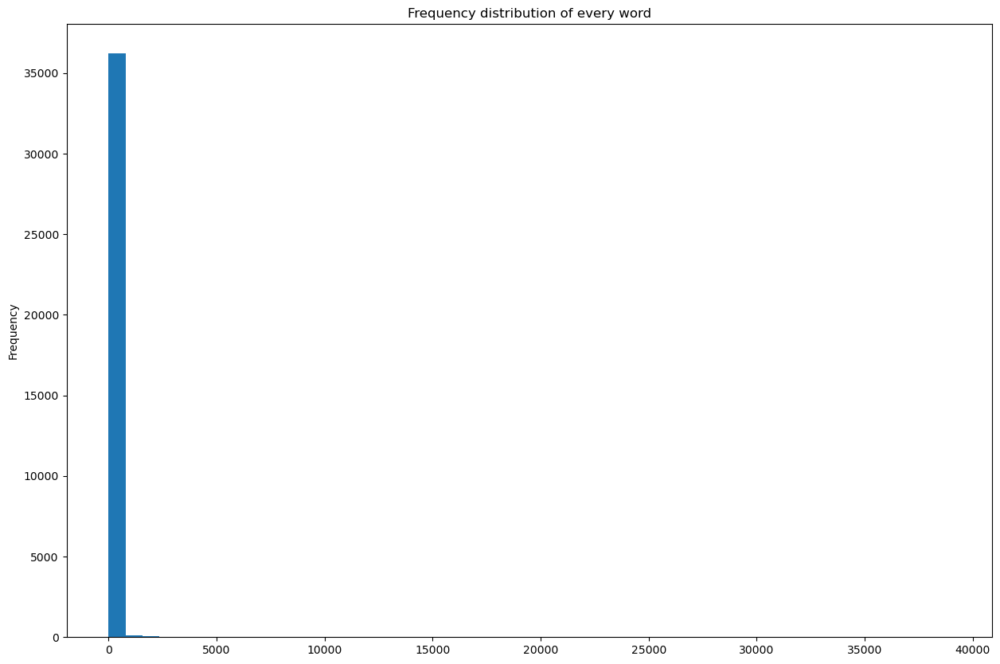

In [26]:
# Plot the frequency distribution of every word in the dataset
plt.figure(figsize=(15, 10))
word_freq.plot(kind="hist", bins=50)
plt.title("Frequency distribution of every word")
plt.show()

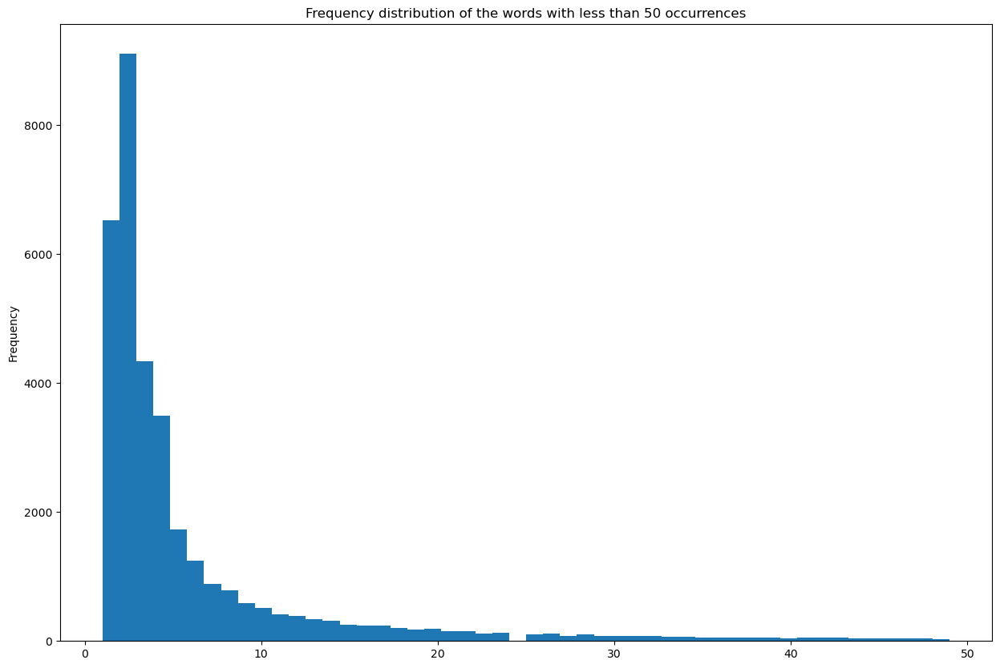

In [27]:
# Plot the frequency distribution of the words with less than 50 occurrences
plt.figure(figsize=(15, 10))
word_freq[word_freq < 50].plot(kind="hist", bins=50)
plt.title("Frequency distribution of the words with less than 50 occurrences")
plt.show()

In [28]:
# Print the number of different words in the dataset
print(f"Number of different words in the dataset: {len(word_freq)}")
# Create a table with the number of words with less than 10, 5, 3 and 2 occurrences. Two columns: frequency and number of words
words_10 = len(word_freq[word_freq < 10])
words_5 = len(word_freq[word_freq < 5])
words_3 = len(word_freq[word_freq < 3])
words_2 = len(word_freq[word_freq < 2])
words_table = pd.DataFrame(
    {
        "Frequency": [10, 5, 3, 2],
        "Number of words": [words_10, words_5, words_3, words_2]
    }
)
words_table

Number of different words in the dataset: 36393


,Frequency,Number of words
0,10,28695
1,5,23454
2,3,15629
3,2,6522


In [29]:
# Create a dictionary with the words and their frequency for faster access
word_freq_dict = word_freq.to_dict()

# Distribución del la longitud del texto

In [30]:
# Get the length of every text
df["text_length"] = df["clean_text"].apply(lambda x: len(x.split()))
df.head()

,text,emotion,clean_text,text_length
0,We can hope,optimism,We hope,2
1,Shhh don't give them the idea!,anger,Shhh dont give idea,4
2,"Thank you so much, kind stranger. I really nee...",gratitude,Thank much kind stranger I really need,7
3,Ion know but it would be better for you to jus...,neutral,Ion know would better buy trim make hard dose,9
4,I'm honestly surprised. We should have fallen ...,excitement,Im honestly surprised We fallen much farther,7


c:\Users\belus\anaconda3\envs\ADNE\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


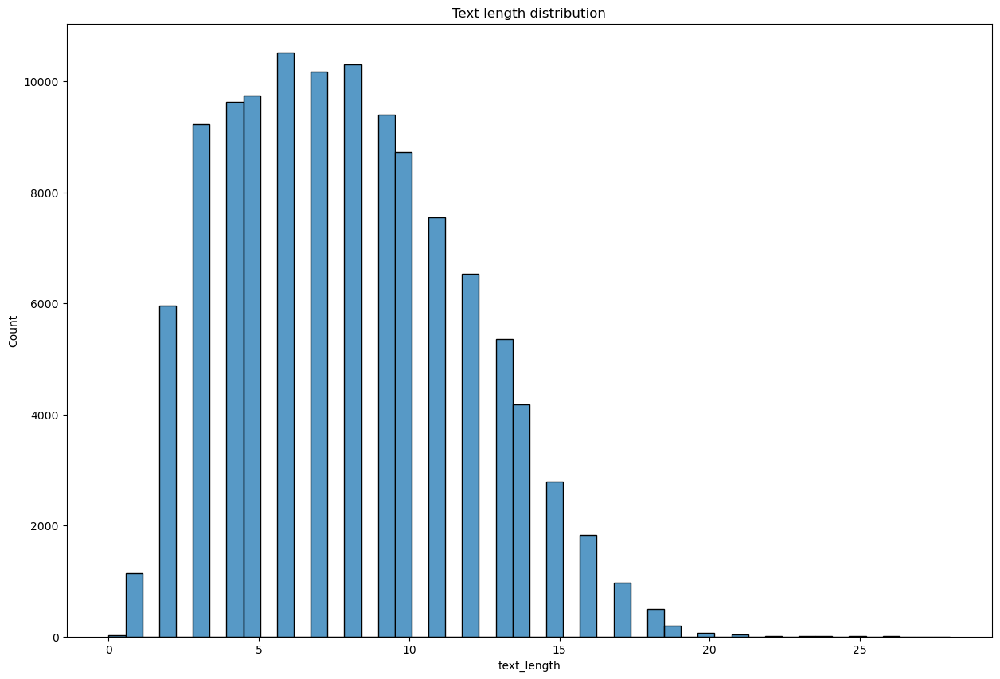

In [31]:
# plot text length distribution
plt.figure(figsize=(15, 10))
sns.histplot(df["text_length"], bins=50)
plt.title("Text length distribution")
plt.show()


In [32]:
# Drop the headlines with 2 or less elements
short_texts = df[df["text_length"] <= 2]
print(f"Number of texts with 2 or less elements: {short_texts.shape[0]}")

# Drop the headlines with 2 or less elements
df = df[df["text_length"] > 2]

Number of texts with 2 or less elements: 7120


In [33]:
# Drop headlines with 20 or more
long_texts = df[df["text_length"] >= 20]
print(f"Number of texts with 20 or more elements: {long_texts.shape[0]}")

# Drop the headlines with 20 or more elements
df = df[df["text_length"] < 20]

Number of texts with 20 or more elements: 138


# Save csv

In [138]:
# Keep the columns clean_text (rename it as text) and emotion
df = df[["clean_text", "emotion"]]
df.columns = ["text", "emotion"]
df.head()

,text,emotion
1,Shhh dont give idea,anger
2,Thank much kind stranger I really need,gratitude
3,Ion know would better buy trim make hard dose,neutral
4,Im honestly surprised We fallen much farther,excitement
5,Jurisprudence fetishist get technicality,neutral


In [139]:
# Let's save the preprocessed dataset into a CSV file, so we can use it in following notebooks. Before doing so, we'll remove the empty rows
df.dropna(inplace=True)
df.to_csv("data/goemotions_clean.csv", index=False)

# Word cloud


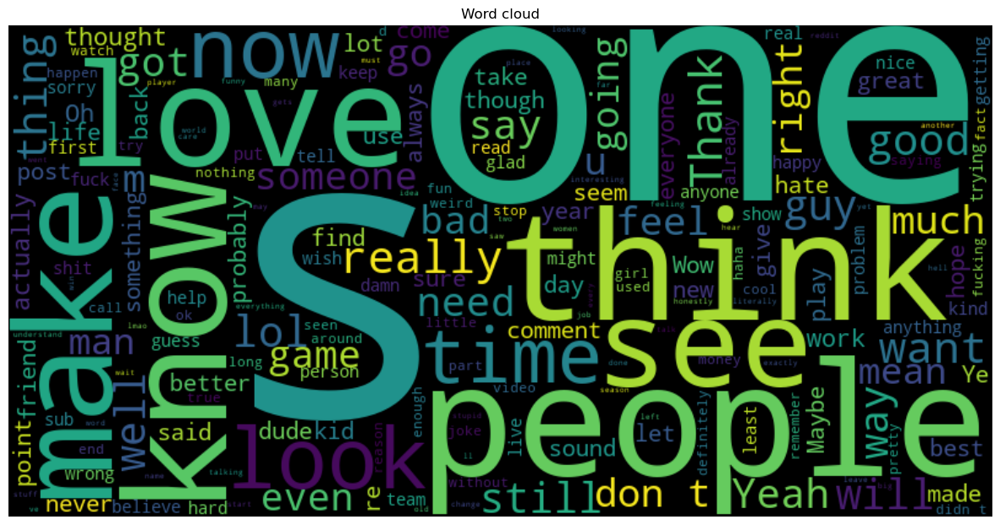

In [36]:
text = " ".join(df["text"]).replace("NAME", "")

# Ahora generamos el word cloud sin la palabra [NAME]
wordcloud = WordCloud(width=800, height=400, background_color="black").generate(text)

# Plotear el word cloud
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word cloud")
plt.show()


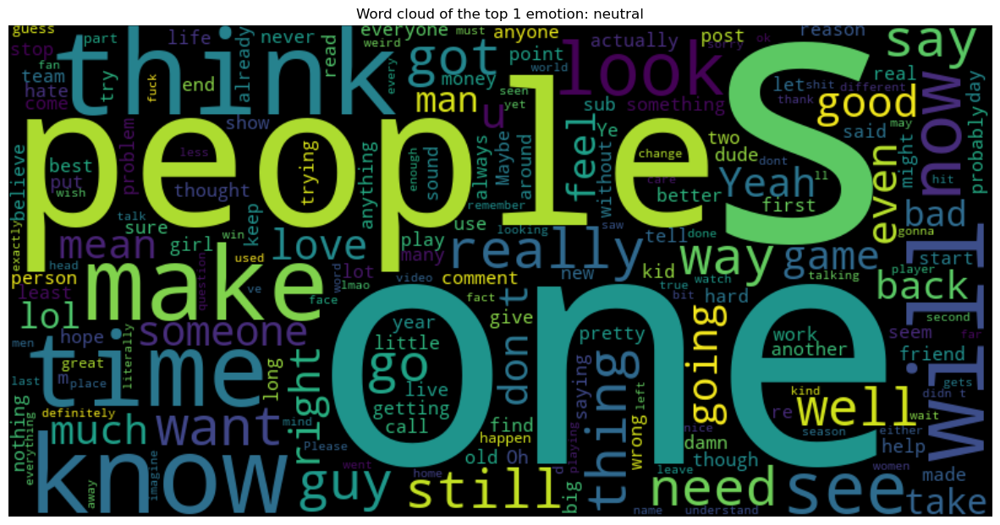

In [35]:
# Filtrar el dataframe para obtener solo los registros con la emoción "neutral"
neutral = df[df["emotion"] == "neutral"]

# Unir todos los textos marcados como 'neutral' en una sola cadena y reemplazar [NAME] con un string vacío
text = " ".join(neutral["text"]).replace("NAME", "")

# Generar el word cloud sin la palabra [NAME]
wordcloud = WordCloud(width=800, height=400, background_color="black").generate(text)

# Plotear el word cloud
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word cloud of the top 1 emotion: neutral")
plt.show()


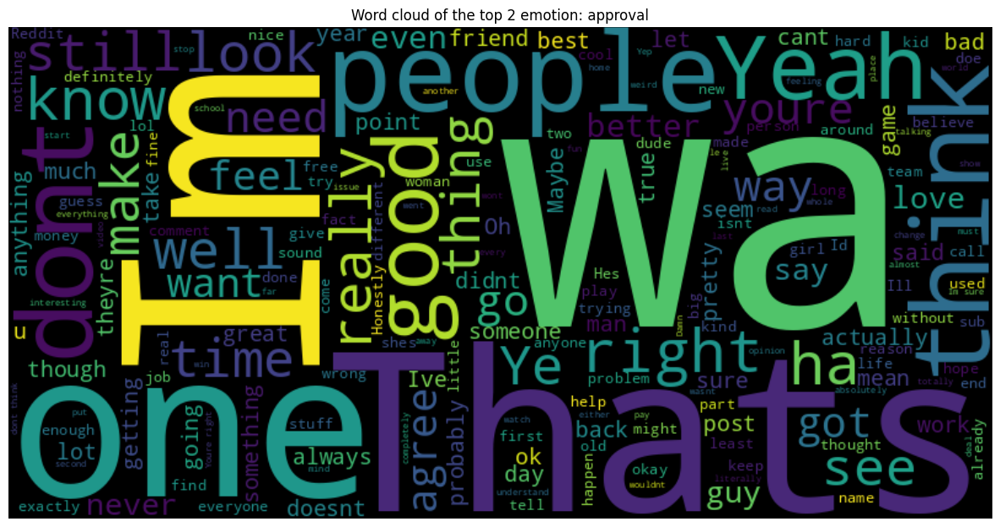

In [142]:
# word cloud of the top 2 emotion: approval
approval = df[df["emotion"] == "approval"]

text = " ".join(approval["text"]).replace("NAME", "")

wordcloud = WordCloud(width=800, height=400, background_color="black").generate(text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word cloud of the top 2 emotion: approval")
plt.show()

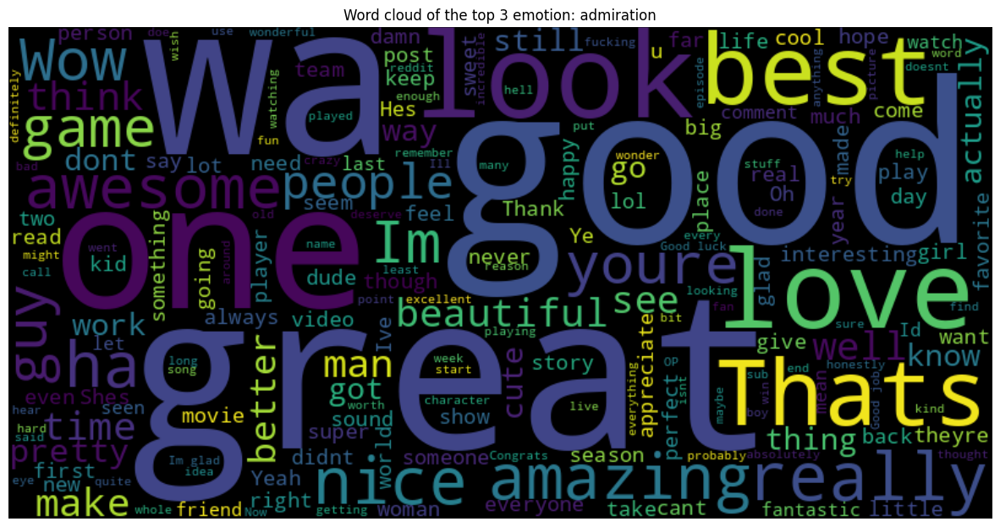

In [143]:
# word cloud of the top 3 emotion: admiration
admiration = df[df["emotion"] == "admiration"]

text = " ".join(admiration["text"]).replace("NAME", "")

wordcloud = WordCloud(width=800, height=400, background_color="black").generate(text)
plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Word cloud of the top 3 emotion: admiration")
plt.show()
